### Data analysis of Section 9 data.



In [1]:
import numpy as np
import pandas as pd
import scipy.io

import matplotlib.pyplot as plt
import sys
sys.path.insert(0, '../')
from M1S_tools import *
import glob

plt.set_cmap('jet')

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
## bending modes & influence matrices etc from Buddy #####################
ML actuators =  165 165
Afn =  (6991, 165)
fv =  (165, 165)
U matrix (6991, 165)
N node =  6991
## bending modes & influence matrices etc from Trupti #####################
N actuators =  170
/Users/bxin/Library/CloudStorage/OneDrive-SharedLibraries-GMTOCorp/M1S Portal - Documents/influnce_matrix_files/OA_influence_matrices_all/OA_surface_normal_165SA_09Jan2025/
Afz =  (27547, 165)
Afx =  (27547, 165)
Afy =  (27547, 165)
U

<Figure size 640x480 with 0 Axes>

In [2]:
dateID = '250116'
TR_IDs = np.loadtxt('../test_input_data/SA_ID_for_IF.txt')
TR_IDs_unique = TR_IDs[TR_IDs<1000]
nSA = len(TR_IDs_unique)
print(nSA)

13


/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 9/250116 GMT3 set1 9.2 5-7 act113 +300 gmtMorph170614 -.h5: Thu Jan 16 09:41:53 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 9/250116 GMT3 set1 9.2 5-7 act113 -300 gmtMorph170614 -.h5: Thu Jan 16 09:45:43 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 9/250116 GMT3 set2 9.2 5-7 act113 -300 gmtMorph170614 -.h5: Thu Jan 16 09:48:58 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 9/250116 GMT3 set2 9.2 5-7 act113 +300 gmtMorph170614 -.h5: Thu Jan 16 09:52:54 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 9/250116 GMT3 set1 9.2 5-7 act126 +300 gmtMorph170614 -.h5: Thu Jan 16 10:18:41 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 9/250116 GMT3 set1 9.2 5-7 act126 -300 gmtMorph170614 -.h5: Thu Jan 16 10:22:51 2025 
/Users/bxin/GMT_docs/1_M1/Analysis/ml_data/data/Optical Data//Sec 9/250116 GMT3 set2 9.2

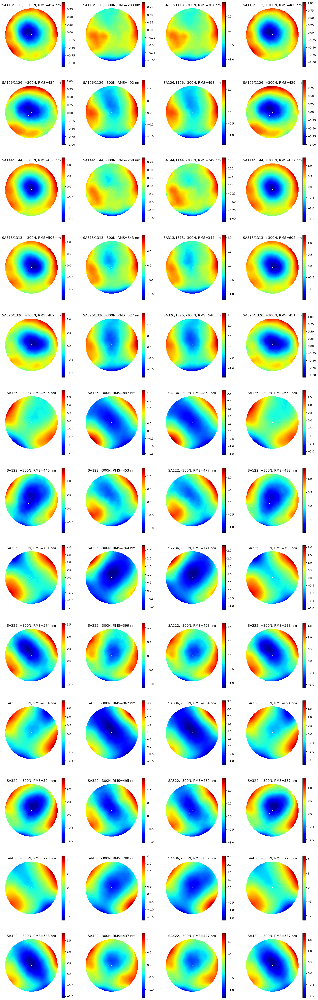

In [3]:
#look at all the +--+ maps
fig, ax = plt.subplots(nSA,4,figsize=(20,5*nSA))
i = 0
for mysaID in TR_IDs_unique:

    signedBend = ['set1*act%d +'%mysaID, 'set1*act%d -'%mysaID,'set2*act%d -'%mysaID, 'set2*act%d +'%mysaID ]
    signshort = '+--+'
    for bend in signedBend:
        irow = np.int8(i/4)
        icol = np.mod(i,4)
        i += 1

        globstring = '%s/Sec 9/%s*%s*-.h5'%(ml_data_dir,dateID, bend)
        #print(globstring)
        fileset = sorted(glob.glob(globstring))
        #print(fileset)
        m1s,centerRow1,centerCol1,pixelSize1, ts = readH5Map(fileset)
        m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm

        img = ax[irow][icol].imshow(m1s, origin='lower')
        fig.colorbar(img, ax=ax[irow][icol])
        mytitle = 'SA%d, %s300N, RMS=%.0f nm'%(mysaID, signshort[icol], m1rms)
        if mysaID+1000 in TR_IDs:
            mytitle = mytitle.replace('%d'%mysaID, '%d/%d'%(mysaID, mysaID+1000))
        ax[irow][icol].set_title(mytitle)
        ax[irow][icol].axis('off')

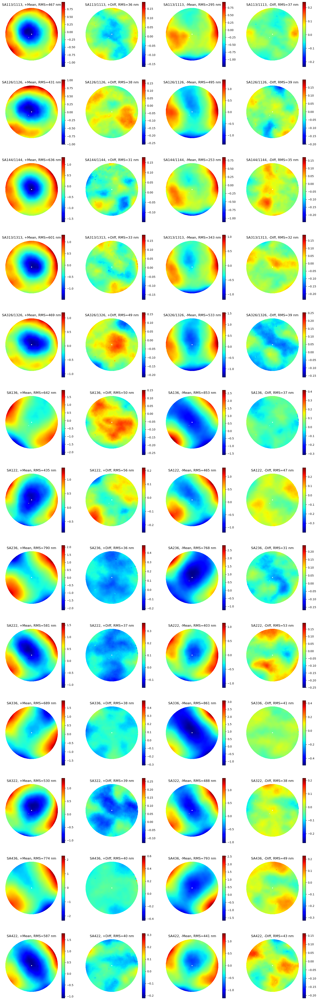

In [4]:
#look at average and diff of each ++ pair and each -- pair
stats = np.zeros((4, nSA))
fig, ax = plt.subplots(nSA,4,figsize=(20,5*nSA))
i = 0
for mysaID in TR_IDs_unique:

    aveplus = np.zeros_like(m1s)
    aveminus = np.zeros_like(m1s)
    diffplus = np.zeros_like(m1s)
    diffminus = np.zeros_like(m1s)
    signedBend = ['set1*act%d +'%mysaID, 'set1*act%d -'%mysaID,'set2*act%d -'%mysaID, 'set2*act%d +'%mysaID ]
    signshort = '+--+'
    for bend in signedBend:

        globstring = '%s/Sec 9/%s*%s*-.h5'%(ml_data_dir,dateID, bend)
        #print(globstring)
        fileset = sorted(glob.glob(globstring))
        #print(fileset)
        m1s,centerRow1,centerCol1,pixelSize1, ts = readH5Map(fileset, verbose=False)
        if '+' in bend:
            aveplus += m1s
            if 'set1' in bend:
                diffplus -= m1s
            else:
                diffplus += m1s #set2 - set1
                aveplus /= 2
        else:
            aveminus += m1s
            if 'set1' in bend:
                diffminus -= m1s
            else:
                diffminus += m1s
                aveminus /= 2
    for j in range(4):
        irow = np.int8(i/4)
        icol = np.mod(i,4)
        i += 1
        if j==0:
            m1s = aveplus
            img = ax[irow][icol].imshow(m1s, origin='lower')
            fig.colorbar(img, ax=ax[irow][icol])
            m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
            mytitle = 'SA%d, +Mean, RMS=%.0f nm'%(mysaID, m1rms)
        elif j==1:
            m1s = diffplus
            img = ax[irow][icol].imshow(m1s, origin='lower')
            fig.colorbar(img, ax=ax[irow][icol])
            m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
            mytitle = 'SA%d, +Diff, RMS=%.0f nm'%(mysaID, m1rms)           
        elif j==2:
            m1s = aveminus
            img = ax[irow][icol].imshow(m1s, origin='lower')
            fig.colorbar(img, ax=ax[irow][icol])
            m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
            mytitle = 'SA%d, -Mean, RMS=%.0f nm'%(mysaID, m1rms)
        elif j==3:
            m1s = diffminus
            img = ax[irow][icol].imshow(m1s, origin='lower')
            fig.colorbar(img, ax=ax[irow][icol])
            m1rms = np.std(m1s[~np.isnan(m1s)])*1000 #convert into nm
            mytitle = 'SA%d, -Diff, RMS=%.0f nm'%(mysaID, m1rms)  
        if mysaID+1000 in TR_IDs:
            mytitle = mytitle.replace('%d'%mysaID, '%d/%d'%(mysaID, mysaID+1000))
        ax[irow][icol].set_title(mytitle)
        ax[irow][icol].axis('off')
        stats[j, np.argmax(TR_IDs_unique==mysaID)] = m1rms

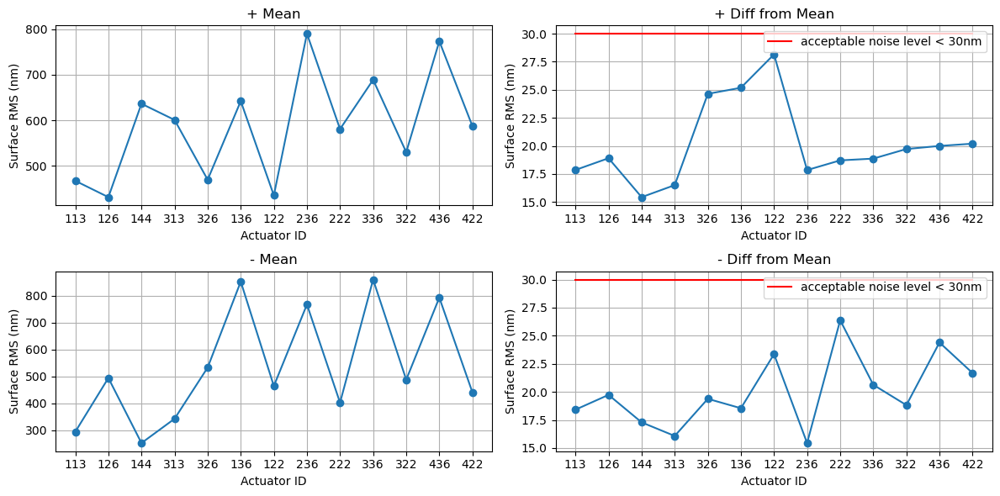

In [5]:
fig, ax = plt.subplots(2,2,figsize=(12, 6))
i = 0
j = 0
ax[i][j].plot(stats[0,:],'-o')
ax[i][j].set_xticks(ticks=np.arange(nSA), labels=['%d'%i for i in TR_IDs_unique])
ax[i][j].grid()
ax[i][j].set_xlabel('Actuator ID')
ax[i][j].set_title('+ Mean')
ax[i][j].set_ylabel('Surface RMS (nm)')
i = 0
j = 1
ax[i][j].plot(stats[j,:]/2,'-o')
ax[i][j].plot([0, nSA-1],[30,30],'-r', label='acceptable noise level < 30nm')
ax[i][j].set_xticks(ticks=np.arange(nSA), labels=['%d'%i for i in TR_IDs_unique])
ax[i][j].grid()
ax[i][j].legend(loc='upper right')
ax[i][j].set_xlabel('Actuator ID')
ax[i][j].set_title('+ Diff from Mean')
ax[i][j].set_ylabel('Surface RMS (nm)')
i = 1
j = 0
ax[i][j].plot(stats[2,:],'-o')
ax[i][j].set_xticks(ticks=np.arange(nSA), labels=['%d'%i for i in TR_IDs_unique])
ax[i][j].grid()
ax[i][j].set_xlabel('Actuator ID')
ax[i][j].set_title('- Mean')
ax[i][j].set_ylabel('Surface RMS (nm)')
i = 1
j = 1
ax[i][j].plot(stats[3,:]/2,'-o')
ax[i][j].plot([0, nSA-1],[30,30],'-r', label='acceptable noise level < 30nm')
ax[i][j].set_xticks(ticks=np.arange(nSA), labels=['%d'%i for i in TR_IDs_unique])
ax[i][j].grid()
ax[i][j].legend(loc='upper right')
ax[i][j].set_xlabel('Actuator ID')
ax[i][j].set_title('- Diff from Mean')
ax[i][j].set_ylabel('Surface RMS (nm)')

plt.tight_layout()


#### Now calculate the single SA influence fuctions

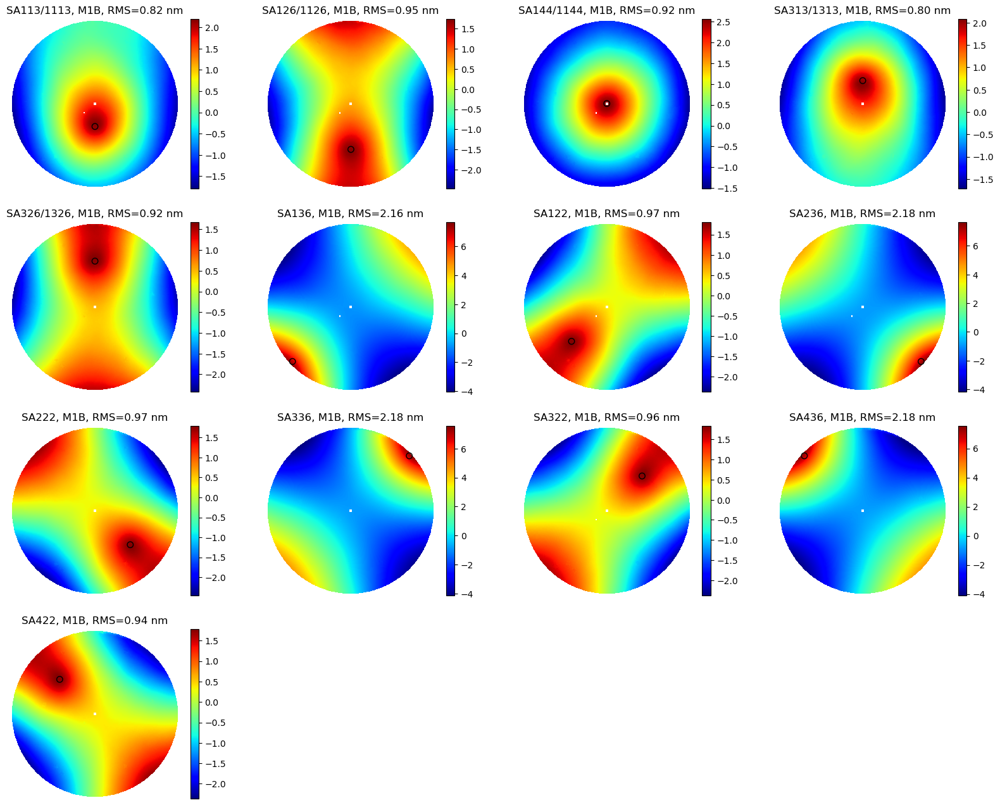

In [6]:
myIF = np.zeros((Sxn, Syn, nSA))
nrow = int(np.ceil(nSA/4.))
fig, ax = plt.subplots(nrow,4,figsize=(20,4*nrow))
i = 0
for mysaID in TR_IDs_unique:
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    i += 1

    signedBend = ['set1*act%d +'%mysaID, 'set1*act%d -'%mysaID,'set2*act%d -'%mysaID, 'set2*act%d +'%mysaID ]
    signshort = '+--+'    
    for bend in signedBend:
        globstring = '%s/Sec 9/%s*%s*-.h5'%(ml_data_dir,dateID, bend)
        #print(globstring)
        fileset = sorted(glob.glob(globstring))
        #print(fileset)
        m1s,centerRow,centerCol,pixelSize, ts = readH5Map(fileset, verbose=False)
        if '+' in bend:
            myIF[:,:,i-1] += m1s
        else:
            myIF[:,:,i-1] -= m1s
    myIF[:,:,i-1] /= (4*300) #300N, normalize to 1N
    myIF[:,:,i-1] = -myIF[:,:,i-1].T *1000 #convert into nm
    m1s = myIF[:,:,i-1]
    m1rms = np.std(m1s[~np.isnan(m1s)])

    img = ax[irow][icol].imshow(m1s, origin='lower')
    fig.colorbar(img, ax=ax[irow][icol])
    mytitle = 'SA%d, M1B, RMS=%.2f nm'%(mysaID, m1rms)
    if mysaID+1000 in TR_IDs:
        mytitle = mytitle.replace('%d'%mysaID, '%d/%d'%(mysaID, mysaID+1000))
    ax[irow][icol].set_title(mytitle)
    circle = plt.Circle((saID2pixx(mysaID, centerRow, centerCol, pixelSize), 
                         saID2pixy(mysaID, centerRow, centerCol, pixelSize)),15, fill=False)
    ax[irow][icol].add_artist(circle)
    ax[irow][icol].axis('off')
for i in range(nSA, nrow*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off')

## GMT single SA IF (influenceMat * [0 0 1 0 0 ... 0])

In [7]:
idx = np.zeros(nact)
for ii in range(nact):
    if saID[ii] in TR_IDs:
        if saz[ii]>0.04:
            idx[ii] = 1
        else:
            idx[ii] = 3

Text(0.5, 1.0, 'Actuator IDs and locations in M1-B Coordinate System')

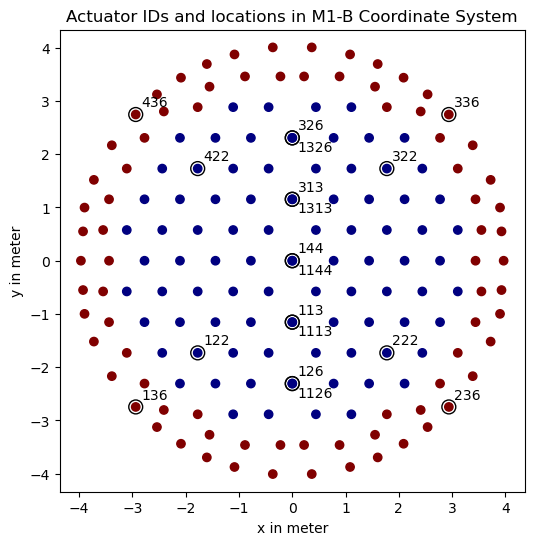

In [8]:
fig, ax = plt.subplots(1,1,figsize=(6,6))
plt.scatter(sax, say, c=saz)
plt.scatter(sax[idx!=0], say[idx!=0], s=100, facecolors='none', edgecolors='k')
for i in range(len(sax)):
    if idx[i] != 0:
        if (np.any(abs(sax[i]+say[i]-sax[:i]-say[:i])<1e-4)):
            plt.text(sax[i]+.1, say[i]-0.25, str(saID[i]))
        else:
            plt.text(sax[i]+.1, say[i]+0.15, str(saID[i]))
plt.axis('equal')
plt.xlabel('x in meter')
plt.ylabel('y in meter')
plt.title('Actuator IDs and locations in M1-B Coordinate System')

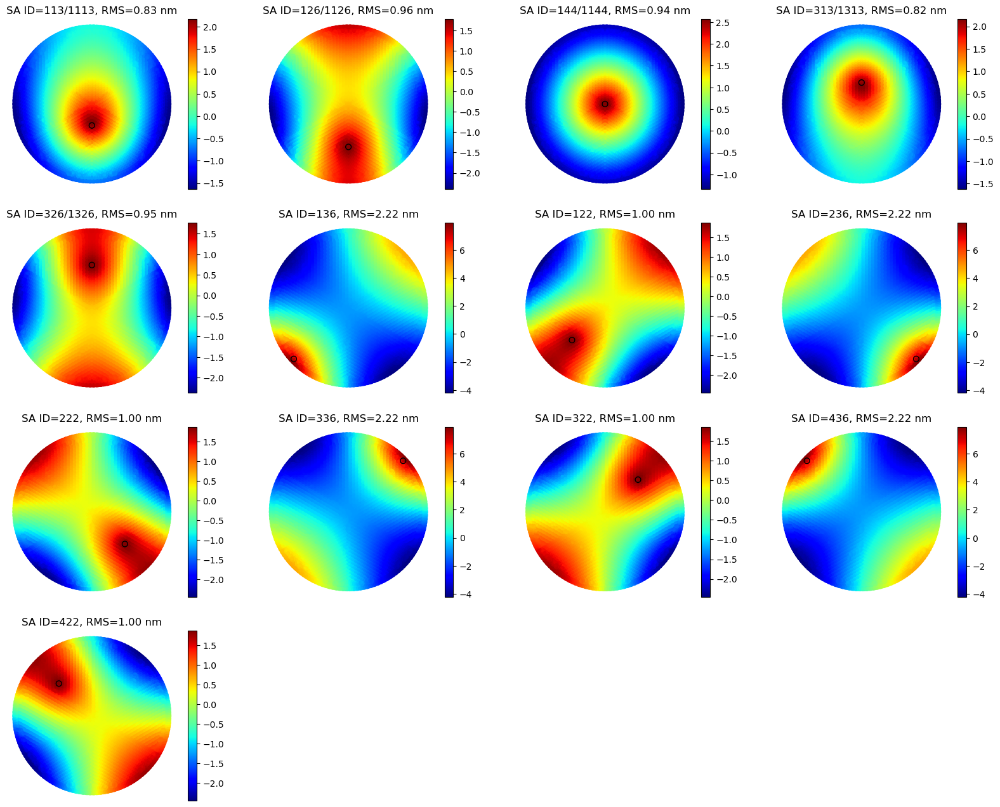

In [9]:
nrow = 4
fig, ax = plt.subplots(nrow,4,figsize=(20,4*nrow))
i = 0
for mysaID in TR_IDs:

    if mysaID < 1000:
        modeID = np.argmax(saID==mysaID)+1
        irow = np.int8(i/4)
        icol = np.mod(i,4)
        i += 1

        img = ax[irow][icol].scatter(nodex, nodey,10, Afz[:,modeID-1]*1e9) #unit to nm
        m1rms = np.std(Afz[:,modeID-1]*1e9)
        if mysaID in TR_IDs[:10]:
            ax[irow][icol].set_title('SA ID=%d/%d, RMS=%.2f nm'%(saID[modeID-1], saID[modeID-1]+1000, m1rms))
        else:
            ax[irow][icol].set_title('SA ID=%d, RMS=%.2f nm'%(saID[modeID-1],m1rms))
        circle = plt.Circle((sax[modeID-1], say[modeID-1]),0.15, fill=False)
        ax[irow][icol].add_artist(circle)
        ax[irow][icol].axis('equal')
        ax[irow][icol].axis('off')
        fig.colorbar(img, ax=ax[irow][icol])
endMode = i
for i in range(endMode, nrow*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off')

#### Perform a least-square fit for each influence function using the FEM-determined influence function. Check the scaling factor and residual from fit. Normalize the residual to 1 N force on the actuator being tested.

SA113/1113, Scaling factor =0.995, Residual RMS = 0.068 nm (per N force)
SA126/1126, Scaling factor =0.992, Residual RMS = 0.035 nm (per N force)
SA144/1144, Scaling factor =0.977, Residual RMS = 0.074 nm (per N force)
SA313/1313, Scaling factor =0.976, Residual RMS = 0.065 nm (per N force)
SA326/1326, Scaling factor =0.961, Residual RMS = 0.033 nm (per N force)
SA136, Scaling factor =0.962, Residual RMS = 0.079 nm (per N force)
SA122, Scaling factor =0.959, Residual RMS = 0.048 nm (per N force)
SA236, Scaling factor =0.972, Residual RMS = 0.062 nm (per N force)
SA222, Scaling factor =0.958, Residual RMS = 0.040 nm (per N force)
SA336, Scaling factor =0.974, Residual RMS = 0.085 nm (per N force)
SA322, Scaling factor =0.948, Residual RMS = 0.053 nm (per N force)
SA436, Scaling factor =0.974, Residual RMS = 0.109 nm (per N force)
SA422, Scaling factor =0.933, Residual RMS = 0.049 nm (per N force)
scaling factor <1 means mirror stiffer than FEM, i.e., model too soft.


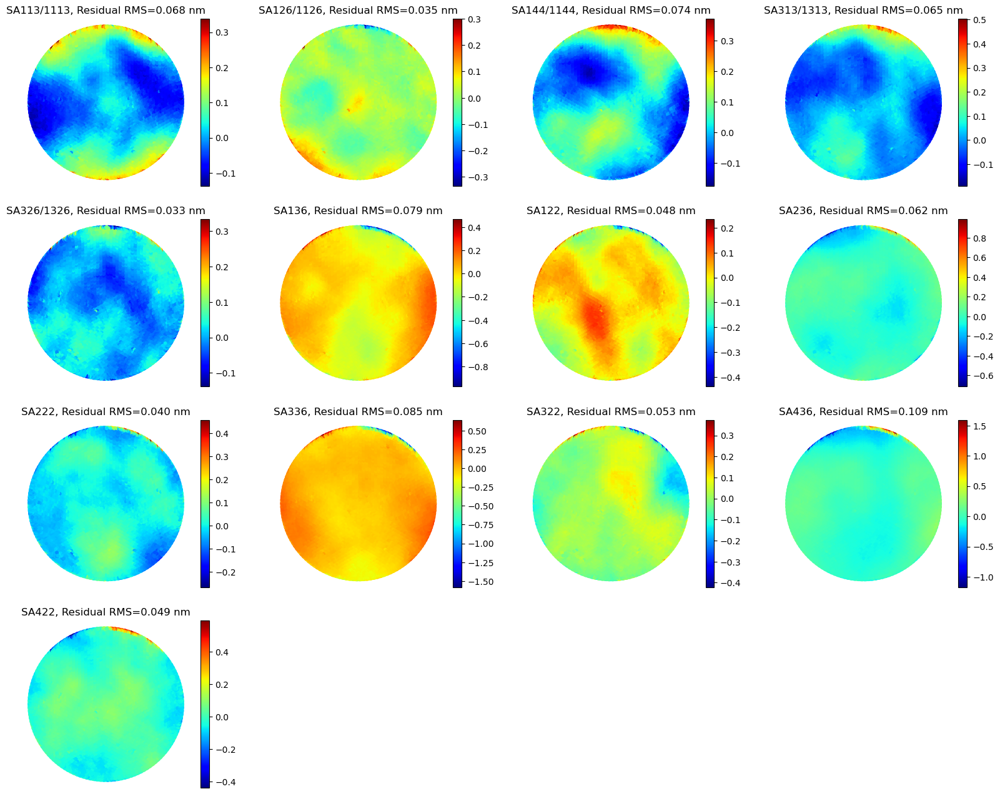

In [10]:
#These 2D interpolations between large grids take a few minutes to run

from scipy.interpolate import LinearNDInterpolator 

scaleF = np.zeros((nSA, 1))
[x1, y1] = mkXYGrid(m1s, centerRow, centerCol, pixelSize)

nrow = int(np.ceil(nSA/4.))
fig, ax = plt.subplots(nrow,4,figsize=(20,4*nrow))
i = 0
for mysaID in TR_IDs_unique:
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    i += 1

    if2d = np.squeeze(myIF[:,:,i-1]) #myIF is already in M1B, in nm
    mask = ~np.isnan(if2d)

    interp = LinearNDInterpolator(list(zip(x1[mask], y1[mask])), if2d[mask], fill_value=0)
    mapOntoGMTFEgrid = interp(nodex, nodey).ravel()
    scaleF[i-1] = np.linalg.pinv(Afz170[:,saID==mysaID]*1e9)  @ mapOntoGMTFEgrid #all in nm
    residual = mapOntoGMTFEgrid - scaleF[i-1]* np.squeeze(Afz170[:,saID==mysaID])*1e9 #this is residual
    
    m1rms = np.std(residual[~np.isnan(residual)]) #already in nm
    mytitle = 'SA%d, Scaling factor =%.3f, Residual RMS = %.3f nm (per N force)'%(mysaID, scaleF[i-1], m1rms)
    if mysaID+1000 in TR_IDs:
        mytitle = mytitle.replace('%d'%mysaID, '%d/%d'%(mysaID, mysaID+1000))
    print(mytitle)
    
    img = ax[irow][icol].scatter(nodex, nodey, 10, residual)
    fig.colorbar(img, ax=ax[irow][icol])
    mytitle = 'SA%d, Residual RMS=%.3f nm'%(mysaID, m1rms)
    if mysaID+1000 in TR_IDs:
        mytitle = mytitle.replace('%d'%mysaID, '%d/%d'%(mysaID, mysaID+1000))
    ax[irow][icol].set_title(mytitle)
    circle = plt.Circle((saID2pixx(mysaID, centerRow, centerCol, pixelSize), 
                         saID2pixy(mysaID, centerRow, centerCol, pixelSize)),15, fill=False)
    ax[irow][icol].add_artist(circle)
    ax[irow][icol].axis('off')
for i in range(nSA, nrow*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off')
print('scaling factor <1 means mirror stiffer than FEM, i.e., model too soft.')

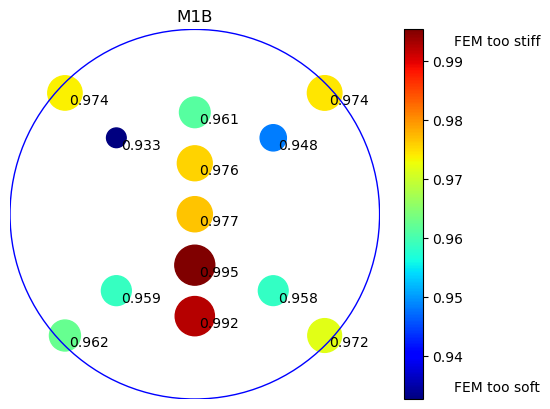

In [11]:
idx = [np.argmax(saID==i) for i in TR_IDs_unique]

fig, ax = plt.subplots()
plt.scatter(sax[idx], say[idx], (scaleF-(np.min(scaleF-0.02)))*1e4, c=scaleF)
circle = plt.Circle((0., 0.), radius_of_CA, color='blue', fill=False)
ax.add_artist(circle)
ax.axis('square')
ax.set_xlim(-radius_of_CA, radius_of_CA)
ax.set_ylim(-radius_of_CA, radius_of_CA)

cbar = plt.colorbar()
cbar.ax.text(5, 0.95, 'FEM too stiff', ha='center', va='bottom', transform=cbar.ax.transAxes)
cbar.ax.text(5, 0.05, 'FEM too soft', ha='center', va='top', transform=cbar.ax.transAxes)
plt.title('M1B')
plt.axis('off')
j=0
for i in idx:
    plt.text(sax[i]+.1, say[i]-0.25, '%.3f'%scaleF[j])
    j+=1

### What if we fit these to the ML influence functions? The force distributions slightly differ....

In [12]:
IF_ml = Afn_ml @ fv_ml

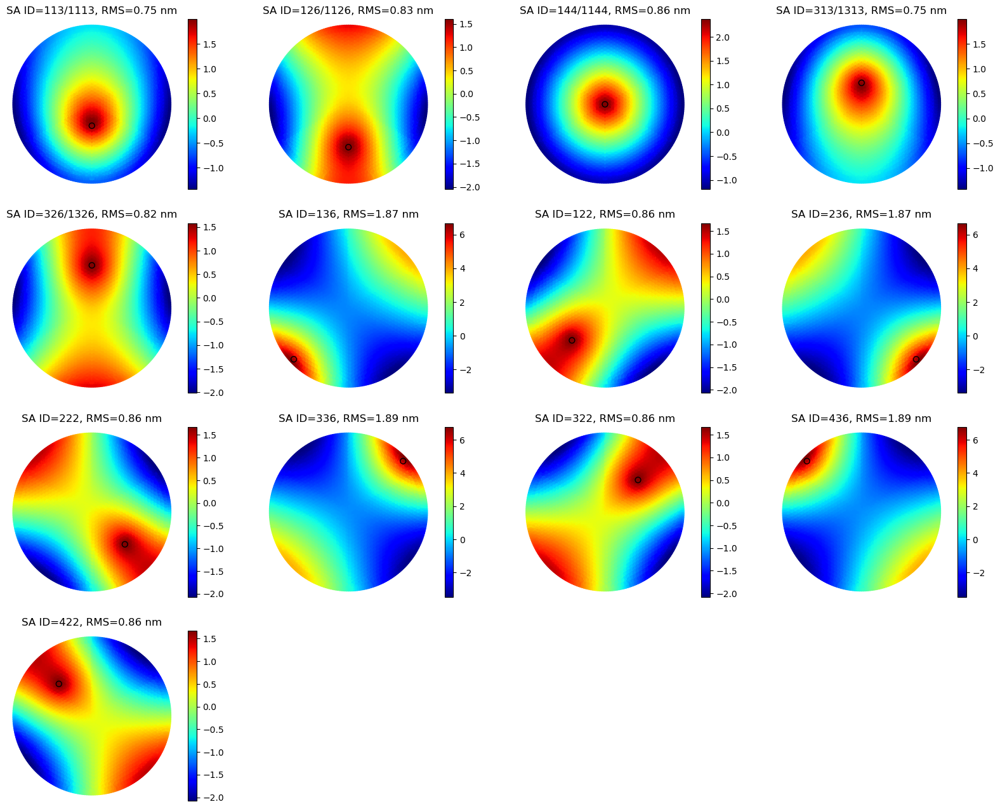

In [13]:
nrow = 4
fig, ax = plt.subplots(nrow,4,figsize=(20,4*nrow))
i = 0
for mysaID in TR_IDs:

    if mysaID < 1000:
        modeID_ml = saID2mlModeID(mysaID) #modeID_ml is in the range [1, 165]
        irow = np.int8(i/4)
        icol = np.mod(i,4)
        i += 1

        img = ax[irow][icol].scatter(nodex_ml, nodey_ml,10, IF_ml[:,modeID_ml-1]) #unit is nm
        m1rms = np.std(IF_ml[:,modeID_ml-1])
        if mysaID in TR_IDs[:10]:
            ax[irow][icol].set_title('SA ID=%d/%d, RMS=%.2f nm'%(mysaID, mysaID+1000, m1rms))
        else:
            ax[irow][icol].set_title('SA ID=%d, RMS=%.2f nm'%(mysaID,m1rms))
        circle = plt.Circle((sax_ml[modeID_ml-1], say_ml[modeID_ml-1]),0.15, fill=False)
        ax[irow][icol].add_artist(circle)
        ax[irow][icol].axis('equal')
        ax[irow][icol].axis('off')
        fig.colorbar(img, ax=ax[irow][icol])
endMode = i
for i in range(endMode, nrow*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off')

SA113/1113, Scaling factor =1.096, Residual RMS = 0.084 nm (per N force)
SA126/1126, Scaling factor =1.154, Residual RMS = 0.051 nm (per N force)
SA144/1144, Scaling factor =1.070, Residual RMS = 0.079 nm (per N force)
SA313/1313, Scaling factor =1.074, Residual RMS = 0.079 nm (per N force)
SA326/1326, Scaling factor =1.121, Residual RMS = 0.054 nm (per N force)
SA136, Scaling factor =1.154, Residual RMS = 0.089 nm (per N force)
SA122, Scaling factor =1.124, Residual RMS = 0.040 nm (per N force)
SA236, Scaling factor =1.165, Residual RMS = 0.082 nm (per N force)
SA222, Scaling factor =1.123, Residual RMS = 0.046 nm (per N force)
SA336, Scaling factor =1.154, Residual RMS = 0.122 nm (per N force)
SA322, Scaling factor =1.109, Residual RMS = 0.046 nm (per N force)
SA436, Scaling factor =1.153, Residual RMS = 0.141 nm (per N force)
SA422, Scaling factor =1.090, Residual RMS = 0.053 nm (per N force)
scaling factor <1 means mirror stiffer than FEM, i.e., model too soft.


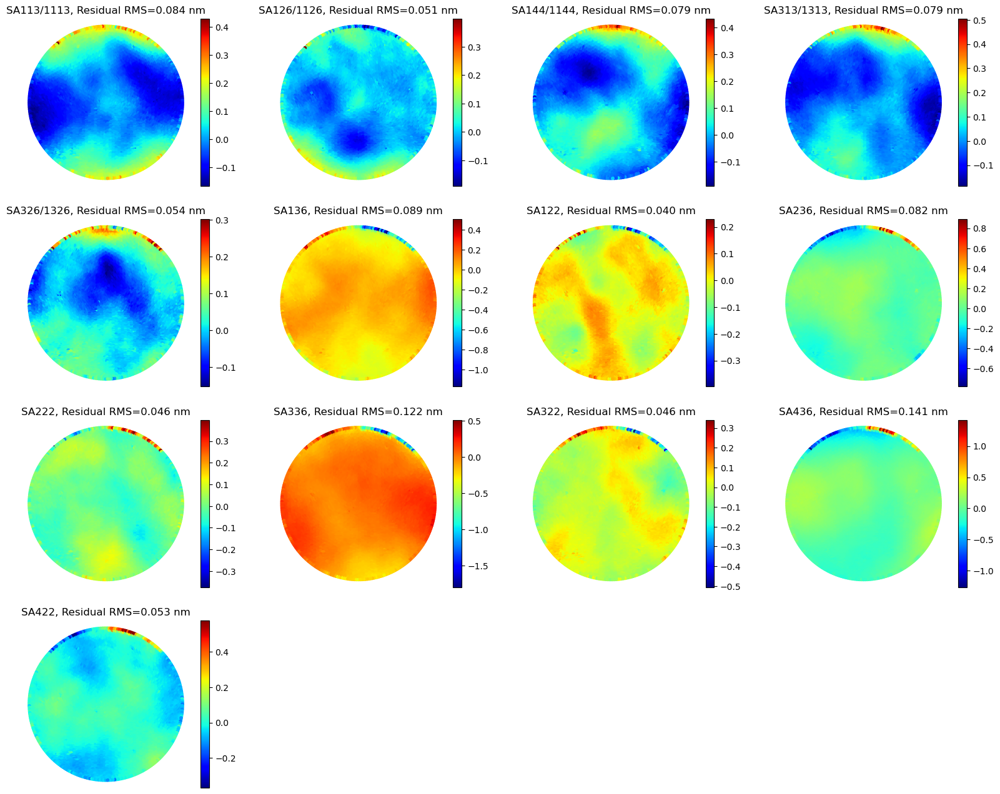

In [14]:
#These 2D interpolations between large grids take a few minutes to run

scaleF_ml = np.zeros((nSA, 1))
[x1, y1] = mkXYGrid(m1s, centerRow, centerCol, pixelSize)

nrow = int(np.ceil(nSA/4.))
fig, ax = plt.subplots(nrow,4,figsize=(20,4*nrow))
i = 0
for mysaID in TR_IDs_unique:
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    i += 1

    if2d = np.squeeze(myIF[:,:,i-1]) #myIF is already in M1B, in nm
    mask = ~np.isnan(if2d)

    modeID_ml = saID2mlModeID(mysaID) #modeID_ml is in the range [1, 165]
    interp = LinearNDInterpolator(list(zip(x1[mask], y1[mask])), if2d[mask], fill_value=0)
    mapOntoMLFEgrid = interp(nodex_ml, nodey_ml).ravel()
    scaleF_ml[i-1] = np.linalg.pinv(IF_ml[:,modeID_ml-1].reshape(-1,1))  @ mapOntoMLFEgrid #all in nm
    residual = mapOntoMLFEgrid - scaleF_ml[i-1]* np.squeeze(IF_ml[:,modeID_ml-1]) #this is residual
    
    m1rms = np.std(residual[~np.isnan(residual)]) #already in nm
    mytitle = 'SA%d, Scaling factor =%.3f, Residual RMS = %.3f nm (per N force)'%(mysaID, scaleF_ml[i-1], m1rms)
    if mysaID+1000 in TR_IDs:
        mytitle = mytitle.replace('%d'%mysaID, '%d/%d'%(mysaID, mysaID+1000))
    print(mytitle)
    
    img = ax[irow][icol].scatter(nodex_ml, nodey_ml, 10, residual)
    fig.colorbar(img, ax=ax[irow][icol])
    mytitle = 'SA%d, Residual RMS=%.3f nm'%(mysaID, m1rms)
    if mysaID+1000 in TR_IDs:
        mytitle = mytitle.replace('%d'%mysaID, '%d/%d'%(mysaID, mysaID+1000))
    ax[irow][icol].set_title(mytitle)
    circle = plt.Circle((saID2pixx(mysaID, centerRow, centerCol, pixelSize), 
                         saID2pixy(mysaID, centerRow, centerCol, pixelSize)),15, fill=False)
    ax[irow][icol].add_artist(circle)
    ax[irow][icol].axis('off')
for i in range(nSA, nrow*4):
    irow = np.int8(i/4)
    icol = np.mod(i,4)
    ax[irow][icol].axis('off')
print('scaling factor <1 means mirror stiffer than FEM, i.e., model too soft.')

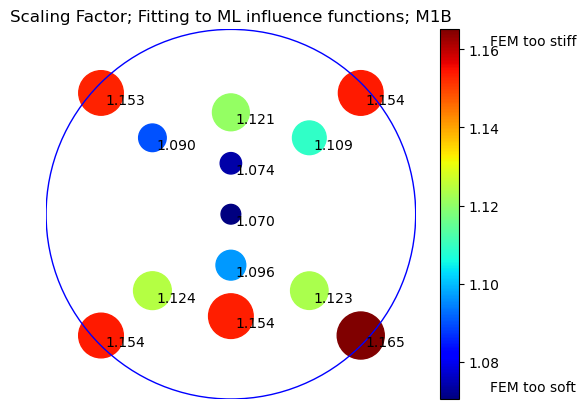

In [17]:
idx = [np.argmax(saID==i) for i in TR_IDs_unique]

fig, ax = plt.subplots()
plt.scatter(sax[idx], say[idx], (scaleF_ml-(np.min(scaleF_ml)-0.02))*1e4, c=scaleF_ml)
circle = plt.Circle((0., 0.), radius_of_CA, color='blue', fill=False)
ax.add_artist(circle)
ax.axis('square')
ax.set_xlim(-radius_of_CA, radius_of_CA)
ax.set_ylim(-radius_of_CA, radius_of_CA)

cbar = plt.colorbar()
cbar.ax.text(5, 0.95, 'FEM too stiff', ha='center', va='bottom', transform=cbar.ax.transAxes)
cbar.ax.text(5, 0.05, 'FEM too soft', ha='center', va='top', transform=cbar.ax.transAxes)
plt.title('Scaling Factor; Fitting to ML influence functions; M1B')
plt.axis('off')
j=0
for i in idx:
    plt.text(sax[i]+.1, say[i]-0.25, '%.3f'%scaleF_ml[j])
    j+=1